### 03 - HEAT WAVES IDENTIFICATION ANDVANCED

The advanced methodology is based on pixel wise approach. This means that every pixel has its own curve describing the temperature threshold along the years. Thus we have a total amount of threshold curvers equals the amount of pixel per each time stamp. 

All the above operations have been performed in colab due to computational-effort reasons

#### 03.0 - Libraries import

In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random

#### 03.1 - Initial data cubes exporation
##### Here we start analyzing the datacube containing the max temperature per pixel per day (dimensions: lat x lon x total days in the datset 15705) and the data cube contaning the thresholds per each pixel (dimensions: lat x lon x total days in the datset 366)


Tmax range: 1981-01-01 00:00:00 → 2023-12-31 00:00:00
Threshold shape: (366, 103, 114) (should be lat x lon x 366)


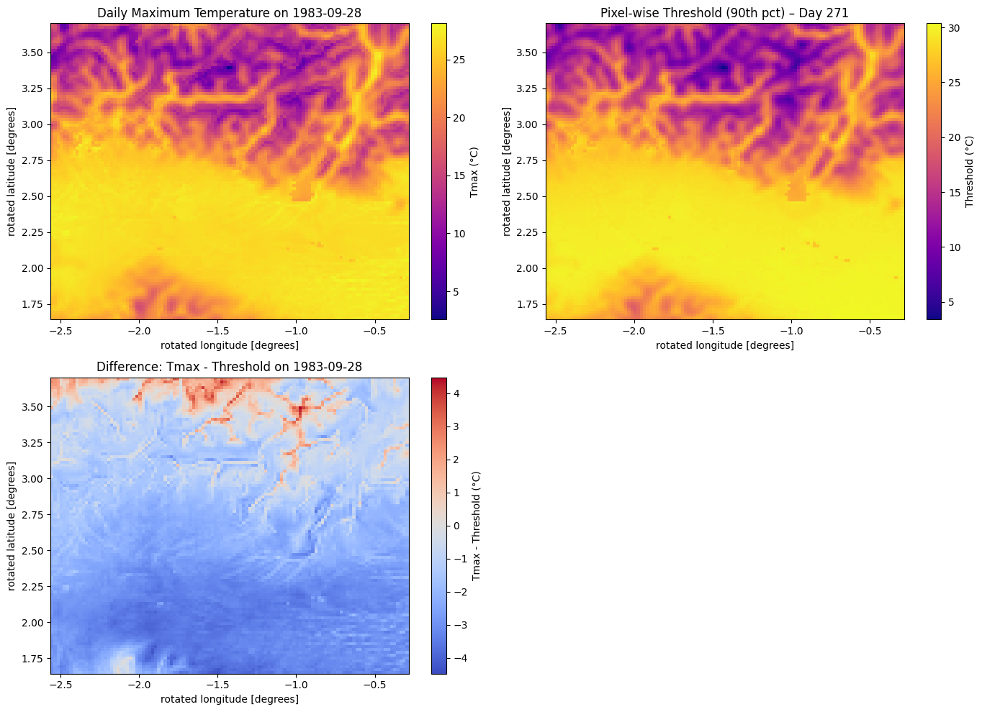


Tmax Statistics:
 - Min: 2.57°C
 - Max: 28.13°C
 - Mean: 21.76°C

Threshold Statistics:
 - Min: 3.39°C
 - Max: 30.38°C
 - Mean: 23.61°C

Difference (Tmax - Threshold) Statistics:
 - Min: -4.32°C
 - Max: 4.48°C
 - Mean: -1.85°C


In [2]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt

# === PATH DEI DATASET ===
tmax_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\tmax_daily_cube_T_2M.nc"
threshold_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\thresholds_15day_90p_T_2M.nc"

# === CARICAMENTO ===
ds_tmax = xr.open_dataset(tmax_path)
ds_thresholds = xr.open_dataset(threshold_path)

# === RANGE TEMPORALE ===
print("\nTmax range:", pd.to_datetime(str(ds_tmax.time.values[0])), "→", pd.to_datetime(str(ds_tmax.time.values[-1])))
print("Threshold shape:", ds_thresholds.TMAX_threshold_15d.shape, "(should be lat x lon x 366)")

# === SELEZIONE GIORNO PER IL PLOT ===
sample_day = ds_tmax.time.values[1000]  # Cambia indice per selezionare un altro giorno
doy = pd.to_datetime(sample_day).dayofyear

# === ESTRAZIONE DATI E CONVERSIONE IN °C ===
tmax_sample = ds_tmax.TMAX_daily.sel(time=sample_day) - 273.15
threshold_sample = ds_thresholds.TMAX_threshold_15d.isel(dayofyear=doy - 1) - 273.15
difference = tmax_sample - threshold_sample

# === PLOT ===
fig, axs = plt.subplots(2, 2, figsize=(14, 10), gridspec_kw={'height_ratios': [1, 1]})

# Tmax
tmax_sample.plot(ax=axs[0, 0], cmap="plasma", cbar_kwargs={'label': 'Tmax (°C)'})
axs[0, 0].set_title(f"Daily Maximum Temperature on {pd.to_datetime(sample_day).strftime('%Y-%m-%d')}")

# Threshold
threshold_sample.plot(ax=axs[0, 1], cmap="plasma", cbar_kwargs={'label': 'Threshold (°C)'})
axs[0, 1].set_title(f"Pixel-wise Threshold (90th pct) – Day {doy}")

# Difference
difference.plot(ax=axs[1, 0], cmap="coolwarm", center=0, cbar_kwargs={'label': 'Tmax - Threshold (°C)'})
axs[1, 0].set_title(f"Difference: Tmax - Threshold on {pd.to_datetime(sample_day).strftime('%Y-%m-%d')}")
axs[1, 1].axis("off")

plt.tight_layout()
plt.show()

# === STATISTICHE BASE ===
print("\nTmax Statistics:")
print(f" - Min: {float(tmax_sample.min()):.2f}°C")
print(f" - Max: {float(tmax_sample.max()):.2f}°C")
print(f" - Mean: {float(tmax_sample.mean()):.2f}°C")

print("\nThreshold Statistics:")
print(f" - Min: {float(threshold_sample.min()):.2f}°C")
print(f" - Max: {float(threshold_sample.max()):.2f}°C")
print(f" - Mean: {float(threshold_sample.mean()):.2f}°C")

print("\nDifference (Tmax - Threshold) Statistics:")
print(f" - Min: {float(difference.min()):.2f}°C")
print(f" - Max: {float(difference.max()):.2f}°C")
print(f" - Mean: {float(difference.mean()):.2f}°C")

In [3]:
fig.savefig(r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\Pixel_residuals.jpg", dpi=300, bbox_inches="tight")

#### 03.2 - Pixelwise threshold analysis

Comparison of the threshold generated by T_2M variable and the one generated by TMAX_2M variable

In [5]:
import numpy as np

data_path_1 = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_TMAX_2M_dataset\thresholds_15day_90p_TMAX_2M.nc"
data_path_2 = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\thresholds_15day_90p_T_2M.nc"

# Esempio: due DataArray o Dataset
da1 = xr.open_dataset(data_path_1)
da2 = xr.open_dataset(data_path_2)

# Confronto solo dei valori numerici
if not np.allclose(da1["TMAX_threshold_15d"].values, da2["TMAX_threshold_15d"].values, equal_nan=True):
    print("I valori della variabile TMAX_threshold_15d sono diversi.")
else:
    print("I valori sono numericamente uguali (con tolleranza).")

I valori della variabile TMAX_threshold_15d sono diversi.


Comparison of the two datasets printing a long (a sort of cross-section)

Rotated longitude selezionata: -1.45325 (indice: 55)


C:\Users\andre\AppData\Local\Temp\ipykernel_31404\1194198587.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


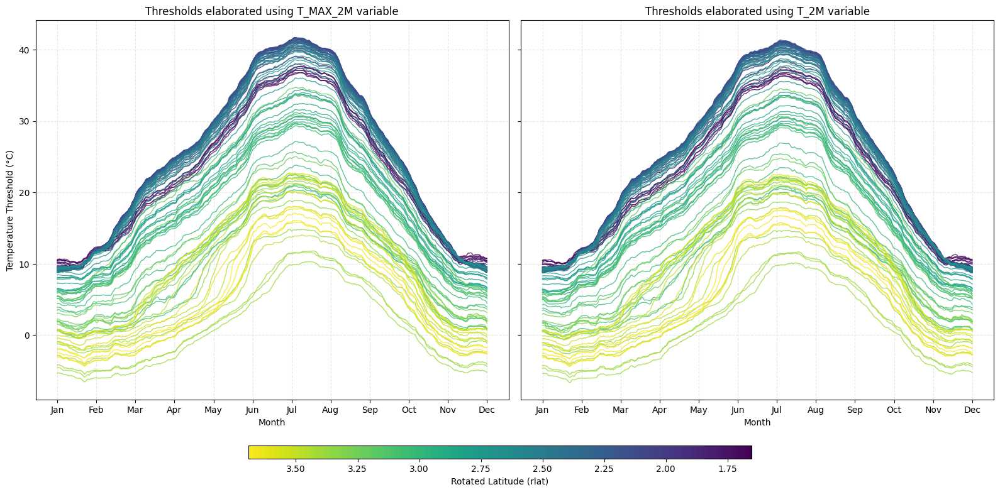

In [6]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# === CONFIG ===
data_path_1 = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_TMAX_2M_dataset\thresholds_15day_90p_TMAX_2M.nc"
data_path_2 = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\thresholds_15day_90p_T_2M.nc"
varname = "TMAX_threshold_15d"  # deve essere lo stesso in entrambi
rlon_input = -1.45

# === CARICAMENTO ===
ds1 = xr.open_dataset(data_path_1)
ds2 = xr.open_dataset(data_path_2)

# === SELEZIONE LONGITUDINE ROTATA ===
rlon_values = ds1['rlon'].values
lon_idx = np.abs(rlon_values - rlon_input).argmin()
print(f"Rotated longitude selezionata: {rlon_values[lon_idx]:.5f} (indice: {lon_idx})")

# === ESTRAZIONE DATI ===
subset1 = ds1[varname].isel(rlon=lon_idx) - 273.15  # in Celsius
subset2 = ds2[varname].isel(rlon=lon_idx) - 273.15

rlats = ds1['rlat'].values
doy = np.arange(1, 367)

# === SETUP FIGURE ===
fig, axes = plt.subplots(1, 2, figsize=(16, 7), sharey=True)

# === NORMALIZZAZIONE COLORI ===
norm = plt.Normalize(rlats.min(), rlats.max())
colors = plt.cm.viridis(norm(rlats))

# === FUNZIONE DI PLOT ===
def plot_threshold_curves(ax, subset, title):
    for i in range(len(rlats)):
        y = subset.isel(rlat=i).values
        ax.plot(doy, y, color=colors[i], alpha=0.8, lw=1)
    month_ticks = np.linspace(1, 366, 12)
    month_labels = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", 
                    "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    ax.set_xticks(month_ticks)
    ax.set_xticklabels(month_labels)
    ax.set_xlabel("Month")
    ax.set_title(title)
    ax.grid(True, linestyle="--", alpha=0.3)

# === PLOTTAGGIO ===
plot_threshold_curves(axes[0], subset1, "Thresholds elaborated using T_MAX_2M variable")
plot_threshold_curves(axes[1], subset2, "Thresholds elaborated using T_2M variable")

axes[0].set_ylabel("Temperature Threshold (°C)")

# === COLORBAR ORIZZONTALE, POSIZIONATA PIÙ IN BASSO MANUALMENTE ===
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

# Aggiungi una nuova area per la colorbar in basso (left, bottom, width, height) in coordinate [0–1]
cbar_ax = fig.add_axes([0.25, -0.05, 0.5, 0.03])  # più basso con bottom < 0
cbar = plt.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label("Rotated Latitude (rlat)")
cbar.ax.invert_xaxis()  # opzionale


plt.tight_layout()
plt.show()

#### 03.3 - Plot of the eventually selected threshold dataset (extracted from the T_2M variable)

Rotated longitude selezionata: -1.45325 (indice: 55)


C:\Users\andre\AppData\Local\Temp\ipykernel_31404\3675163555.py:75: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


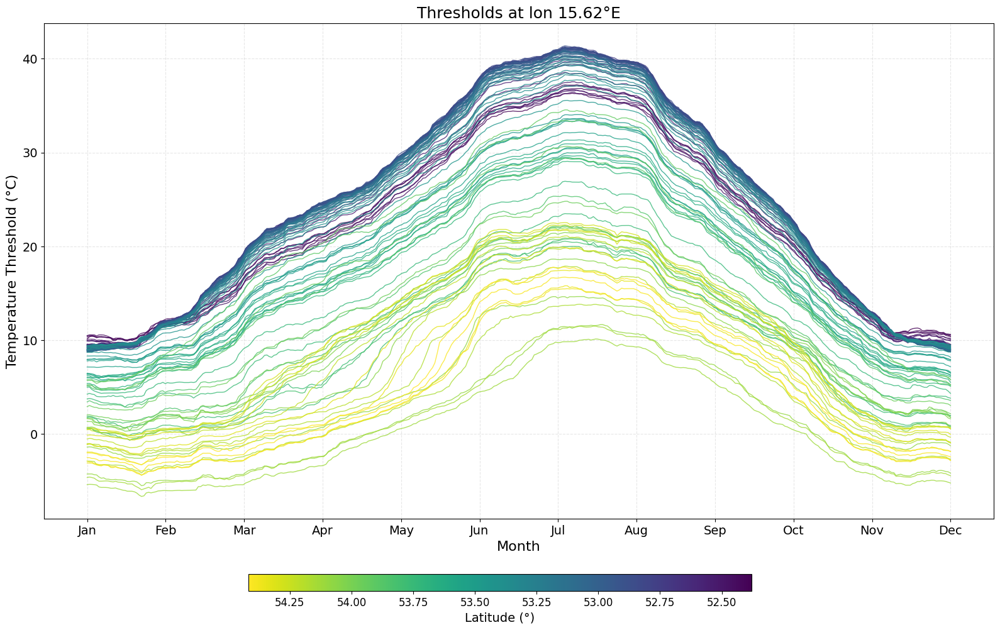

In [18]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from pyproj import CRS, Transformer

# === CONFIG ===
data_path_2 = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\thresholds_15day_90p_T_2M.nc"
varname = "TMAX_threshold_15d"
rlon_input = -1.45

# === CARICAMENTO ===
ds2 = xr.open_dataset(data_path_2)

# === SELEZIONE LONGITUDINE ROTATA ===
rlon_values = ds2['rlon'].values
lon_idx = np.abs(rlon_values - rlon_input).argmin()
rlon_selected = rlon_values[lon_idx]
print(f"Rotated longitude selezionata: {rlon_selected:.5f} (indice: {lon_idx})")

# === ESTRAZIONE DATI ===
subset2 = ds2[varname].isel(rlon=lon_idx) - 273.15  # Kelvin → °C
rlats = ds2['rlat'].values
doy = np.arange(1, 367)

# === CONVERSIONE rlat → lat e rlon → lon reale
rotated_crs = CRS.from_cf({
    "grid_mapping_name": "rotated_latitude_longitude",
    "grid_north_pole_latitude": 39.25,
    "grid_north_pole_longitude": -162.0,
    "north_pole_grid_longitude": 0.0
})
geodetic_crs = CRS.from_epsg(4326)
transformer = Transformer.from_crs(rotated_crs, geodetic_crs, always_xy=True)

# Convertiamo la colonna selezionata (stessa rlon, tutte le rlat)
rlon_array = np.full_like(rlats, rlon_selected)
lons, lats = transformer.transform(rlon_array, rlats)
lon_geographic = lons[0]  # una qualsiasi va bene, sono tutte uguali

# === SETUP FIGURE ===
fig, ax = plt.subplots(figsize=(16, 9))  # figura alta e larga

# === NORMALIZZAZIONE COLORI CON lat ===
norm = plt.Normalize(lats.min(), lats.max())
colors = plt.cm.viridis(norm(lats))

# === PLOT ===
for i in range(len(rlats)):
    y = subset2.isel(rlat=i).values
    ax.plot(doy, y, color=colors[i], alpha=0.8, lw=1)

# === Etichette asse X ===
month_ticks = np.linspace(1, 366, 12)
month_labels = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", 
                "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
ax.set_xticks(month_ticks)
ax.set_xticklabels(month_labels, fontsize=14)

# === Titoli e assi ===
ax.set_xlabel("Month", fontsize=16)
ax.set_ylabel("Temperature Threshold (°C)", fontsize=16)
ax.set_title(f"Thresholds at lon {lon_geographic:.2f}°E", fontsize=18)
ax.tick_params(axis='y', labelsize=14)
ax.grid(True, linestyle="--", alpha=0.3)

# === COLORBAR ===
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.25, -0.05, 0.5, 0.03])
cbar = plt.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label("Latitude (°)", fontsize=14)
cbar.ax.tick_params(labelsize=12)
cbar.ax.invert_xaxis()

plt.tight_layout()
plt.show()

In [19]:
fig.savefig(r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\Thresholds_2d.jpg", dpi=300, bbox_inches="tight")

#### 03.4 - Specific analysis of July and August maxs temperatures across the years

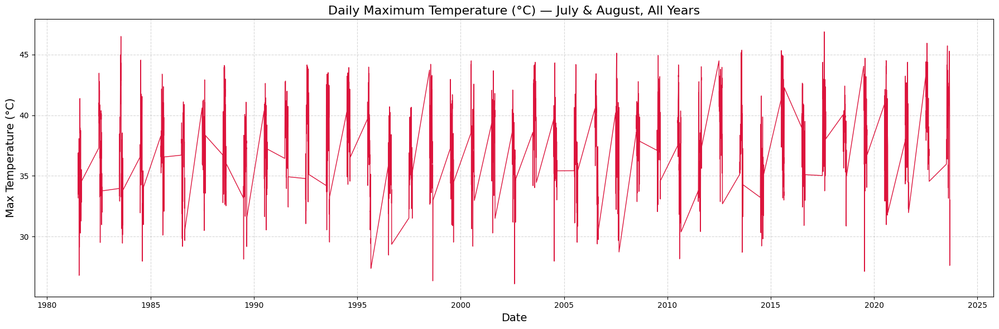

In [7]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np

# === CONFIG ===
data_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\tmax_daily_cube_T_2M.nc"
varname = "TMAX_daily"  # Cambia se il nome è diverso
spatial_dims = ["rlat", "rlon"]  # cambia se diverso nel tuo dataset

# === CARICA IL DATASET ===
ds = xr.open_dataset(data_path)

# === SELEZIONA SOLO LUGLIO E AGOSTO ===
ds_summer = ds.sel(time=ds.time.dt.month.isin([7, 8]))

# === CALCOLA MASSIMI SPAZIALI PER OGNI GIORNO ===
tmax = ds_summer[varname]
tmax_max = tmax.max(dim=spatial_dims)

# === CONVERTI IN CELSIUS SE NECESSARIO ===
if tmax_max.max() > 100:
    tmax_max = tmax_max - 273.15

# === PLOT ===
plt.figure(figsize=(18, 6))
plt.plot(tmax_max['time'].values, tmax_max.values, color="crimson", lw=1)

plt.title("Daily Maximum Temperature (°C) — July & August, All Years", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Max Temperature (°C)", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.savefig(r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\July_August_max_temp_all_years.jpg", dpi=300, bbox_inches="tight")
plt.show()

In [6]:
plt.savefig(r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\July_August_max_temp_all_years.jpg", dpi=300, bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

#### 03.5 - 3d viz of the thresholds for all pixel of a define longitude

In [23]:
import xarray as xr
import numpy as np
import plotly.graph_objects as go
from pyproj import CRS, Transformer

# === CONFIG ===
file_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\thresholds_15day_90p_T_2M.nc"
rlon_input = -1.45  # Cambia se vuoi selezionare un'altra longitudine

# === LOAD DATASET ===
ds = xr.open_dataset(file_path)

# === TROVA INDICE LONGITUDINE ===
lon_idx = np.abs(ds['rlon'].values - rlon_input).argmin()
rlon_selected = ds['rlon'].values[lon_idx]
print(f"Selected rotated longitude: {rlon_selected:.2f} (index {lon_idx})")

# === ESTRAI E CONVERTI A CELSIUS ===
thresholds_k = ds['TMAX_threshold_15d'].isel(rlon=lon_idx)
thresholds_c = thresholds_k - 273.15
thresholds_c = thresholds_c.transpose("rlat", "dayofyear")

# === RIMUOVI NaN ===
thresholds_c_clean = thresholds_c.where(~np.isnan(thresholds_c), other=0)

# === CONVERSIONE rlat → lat geografica ===
rlats = ds['rlat'].values
rlon_array = np.full_like(rlats, rlon_selected)

rotated_crs = CRS.from_cf({
    "grid_mapping_name": "rotated_latitude_longitude",
    "grid_north_pole_latitude": 39.25,
    "grid_north_pole_longitude": -162.0,
    "north_pole_grid_longitude": 0.0
})
geodetic_crs = CRS.from_epsg(4326)
transformer = Transformer.from_crs(rotated_crs, geodetic_crs, always_xy=True)
lons, lats = transformer.transform(rlon_array, rlats)
lon_geographic = lons[0]  # una qualunque va bene

# === COORDINATE ===
days = np.arange(1, 367)
X, Y = np.meshgrid(days, lats)  # lat invece di rotated_lat

# === PLOT ===
fig = go.Figure(data=[go.Surface(
    z=thresholds_c_clean.values,
    x=X,
    y=Y,
    colorscale='Viridis',
    colorbar=dict(title="Threshold (°C)")
)])

fig.update_layout(
    title=f"Daily Heatwave Thresholds (°C) at lon ≈ {lon_geographic:.2f}°E (rotated: {rlon_selected:.2f})",
    scene=dict(
        xaxis_title='Day of Year',
        yaxis_title='Latitude (°)',
        zaxis_title='Threshold (°C)',
        xaxis=dict(tickmode='array', tickvals=np.linspace(1, 366, 12),
                   ticktext=["Jan", "Feb", "Mar", "Apr", "May", "Jun",
                             "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
    ),
    autosize=True,
    margin=dict(l=10, r=10, b=10, t=40)
)

fig.show()

Selected rotated longitude: -1.45 (index 55)


#### 03.6 - Estraction of the heat wave dataset
##### Generation of the data cube containing the residuals between each pixel temperature and its own threshold for each day of the whole dataset

In [16]:
import xarray as xr
import numpy as np
import pandas as pd
from datetime import datetime
import os

# === PATH DATASET ===
tmax_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\tmax_daily_cube_T_2M.nc"
thresholds_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\thresholds_15day_90p_T_2M.nc"
output_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\residuals_daily_cube_T_2M.nc"

# === RIMOZIONE FILE OUTPUT SE ESISTE ===
if os.path.exists(output_path):
    os.remove(output_path)
    print(f" File esistente rimosso: {output_path}")

# === CARICAMENTO DATASET ===
print(" Caricamento dataset Tmax...")
ds_tmax = xr.open_dataset(tmax_path)
print(" Caricamento dataset soglie...")
ds_thr = xr.open_dataset(thresholds_path)

# === VARIABILI ===
tmax = ds_tmax["TMAX_daily"]
thresholds = ds_thr["TMAX_threshold_15d"]

# === INFO ===
print(f"\nTmax shape: {tmax.shape} (time, rlat, rlon)")
print(f"Threshold shape: {thresholds.shape} (rlat, rlon, dayofyear)")

# === CALCOLO RESIDUI ===
print("\n Inizio calcolo residui...")
start_time = datetime.now()

# Estrai dayofyear per ogni giorno del dataset Tmax
dayofyears = pd.to_datetime(tmax["time"].values).dayofyear

# Crea array di soglie per ogni giorno
thresholds_matched = xr.concat(
    [thresholds.isel(dayofyear=doy - 1) for doy in dayofyears],
    dim="time"
)
thresholds_matched["time"] = tmax["time"]

# Calcolo residui
residuals = tmax - thresholds_matched
residuals.name = "TMAX_residual"
residuals.attrs["units"] = "°C"
residuals.attrs["description"] = "TMAX - soglia_15day_90p"

# === SALVA ===
print(f"\n Salvataggio su: {output_path}")
residuals.to_dataset().to_netcdf(output_path)

end_time = datetime.now()
elapsed = (end_time - start_time).total_seconds() / 60
print(f"\n Operazione completata in {elapsed:.1f} minuti.")

 Caricamento dataset Tmax...
 Caricamento dataset soglie...

Tmax shape: (15705, 103, 114) (time, rlat, rlon)
Threshold shape: (366, 103, 114) (rlat, rlon, dayofyear)

 Inizio calcolo residui...

 Salvataggio su: C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\residuals_daily_cube_T_2M.nc

 Operazione completata in 2.4 minuti.


<xarray.Dataset>
Dimensions:        (time: 15705, rlon: 114, rlat: 103)
Coordinates:
  * time           (time) datetime64[ns] 1981-01-01 1981-01-02 ... 2023-12-31
  * rlon           (rlon) float64 -2.553 -2.533 -2.513 ... -0.3132 -0.2932
    lon            (rlat, rlon) float32 ...
    lat            (rlat, rlon) float32 ...
  * rlat           (rlat) float64 1.652 1.672 1.692 1.712 ... 3.652 3.672 3.692
    height_2m      float32 ...
    dayofyear      (time) int32 ...
Data variables:
    TMAX_residual  (time, rlat, rlon) float32 ...


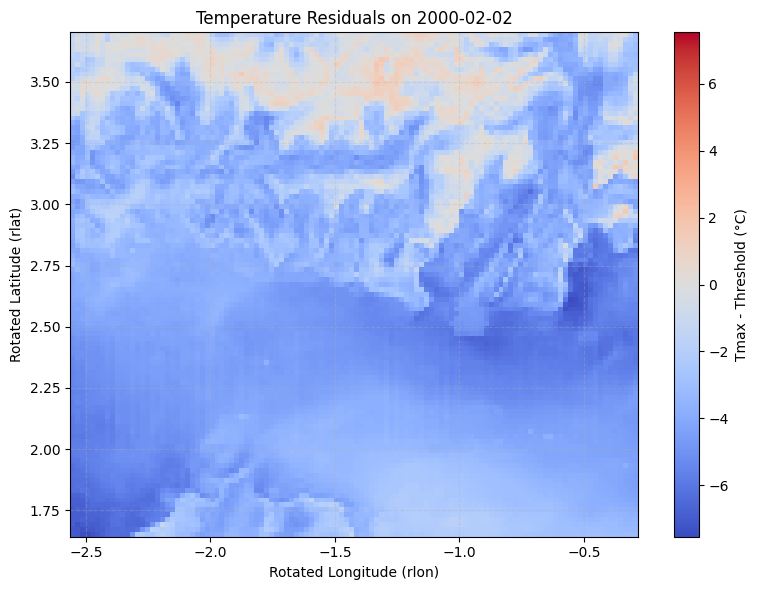

In [27]:
# === CONFIG ===
residuals_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\residuals_daily_cube_T_2M.nc"
var_name = "TMAX_residual"  # Nome della variabile nel file

# === CARICA DATASET ===
ds = xr.open_dataset(residuals_path)
print(ds)

# === SCEGLI GIORNO CASUALE ===
times = ds["time"].values
random_day = random.choice(times)

# === ESTRAI MAPPA DEL GIORNO ===
residual_day = ds[var_name].sel(time=random_day)

# === PLOT ===
plt.figure(figsize=(8, 6))
residual_day.plot(
    cmap="coolwarm",
    center=0,
    cbar_kwargs={'label': 'Tmax - Threshold (°C)'}
)
plt.title(f"Temperature Residuals on {pd.to_datetime(str(random_day)).strftime('%Y-%m-%d')}")
plt.xlabel("Rotated Longitude (rlon)")
plt.ylabel("Rotated Latitude (rlat)")
plt.grid(True, linestyle="--", alpha=0.3)
plt.tight_layout()
plt.show()

#### 03.7 - Heatwave duration and intensity extraction from the residual data cube for a single year

In [37]:
import xarray as xr
import numpy as np
import pandas as pd
import os

# === CONFIGURAZIONE ===
residuals_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\residuals_daily_cube_T_2M.nc"
anno_da_analizzare = 1995
soglia_percentuale = 0.60  # 60% dei pixel positivi
pixel_area_km2 = 2.2 * 2.2  # area di ciascun pixel (km²)
area_minima_km2 = 40000     # soglia minima di area coperta (km²)

# === CARICAMENTO DATASET ===
ds = xr.open_dataset(residuals_path)
residui = ds["TMAX_residual"]

# === SELEZIONE ANNO SPECIFICO ===
residui_anno = residui.sel(time=residui["time"].dt.year == anno_da_analizzare)

# === ANALISI GIORNO PER GIORNO ===
eventi_giornalieri = []

for t in residui_anno.time:
    giorno = pd.to_datetime(t.values)
    residuo_giornaliero = residui_anno.sel(time=t)
    valori = residuo_giornaliero.values
    valori_validi = ~np.isnan(valori)

    n_pixel_validi = valori_validi.sum()
    n_pixel_positivi = (valori > 0).sum()

    percentuale_positivi = n_pixel_positivi / n_pixel_validi
    area_positiva = n_pixel_positivi * pixel_area_km2

    if (percentuale_positivi >= soglia_percentuale) and (area_positiva >= area_minima_km2):
        media_positivi = valori[valori > 0].mean()
        media_totale = np.nanmean(valori)  # include anche negativi
        eventi_giornalieri.append({
            "date": giorno,
            "avg_positive_excess": float(media_positivi),
            "avg_all_residuals": float(media_totale)
        })

# === AGGREGAZIONE DEGLI EVENTI CONSECUTIVI ===
eventi_df = pd.DataFrame(eventi_giornalieri)

output = []
if not eventi_df.empty:
    eventi_df["gap"] = (eventi_df["date"] - eventi_df["date"].shift()).dt.days.ne(1).cumsum()

    for _, gruppo in eventi_df.groupby("gap"):
        d_start = gruppo["date"].min()
        d_end = gruppo["date"].max()
        duration = len(gruppo)
        summed_avg_positive = gruppo["avg_positive_excess"].sum()
        summed_avg_all = gruppo["avg_all_residuals"].sum()

        output.append({
            "d_start": d_start,
            "d_end": d_end,
            "duration": duration,
            "summed_avg_all_residuals": summed_avg_all,
            "summed_avg_positive_residuals": summed_avg_positive
        })

# === RISULTATO ===
df_finale = pd.DataFrame(output)
print(df_finale.head(30))

     d_start      d_end  duration  summed_avg_all_residuals  \
0 1995-02-05 1995-02-05         1                  0.758127   
1 1995-02-07 1995-02-07         1                  1.870148   
2 1995-04-02 1995-04-03         2                  2.299502   
3 1995-04-07 1995-04-07         1                  1.424201   
4 1995-05-07 1995-05-07         1                  0.656977   
5 1995-07-22 1995-07-22         1                  0.805959   

   summed_avg_positive_residuals  
0                       1.805956  
1                       2.115110  
2                       3.429016  
3                       1.722135  
4                       0.923978  
5                       1.109127  


#### 03.8 - Heatwave duration and intensity extraction from the residual data cube for the entire period 1981-2023

In [35]:
import xarray as xr
import numpy as np
import pandas as pd
import os

# === CONFIGURAZIONE ===
residuals_path = r"C:\Users\andre\OneDrive\Desktop\Datasets_Geoinfprj\Pixelwise_thresholds_extraction_&_max_daily_temp\extraction_thorugh_T_2M_dataset\residuals_daily_cube_T_2M.nc"
soglia_percentuale = 0.60  # 60% dei pixel positivi
pixel_area_km2 = 2.2 * 2.2  # area di ciascun pixel (km²)
area_minima_km2 = 40000     # soglia minima di area coperta (km²)
output_csv = "heat_waves_events_81_23.csv"

# === CARICAMENTO DATASET ===
ds = xr.open_dataset(residuals_path)
residui = ds["TMAX_residual"]

# === ESTRAI ANNI DISPONIBILI ===
anni_disponibili = np.unique(ds.time.dt.year.values)

# === PROCESSA OGNI ANNO ===
tutti_gli_eventi = []

for anno in anni_disponibili:
    print(f"Elaborazione anno: {anno}")
    residui_anno = residui.sel(time=residui["time"].dt.year == anno)
    eventi_giornalieri = []

    for t in residui_anno.time:
        giorno = pd.to_datetime(t.values)
        residuo_giornaliero = residui_anno.sel(time=t)
        valori = residuo_giornaliero.values
        valori_validi = ~np.isnan(valori)

        n_pixel_validi = valori_validi.sum()
        n_pixel_positivi = (valori > 0).sum()

        percentuale_positivi = n_pixel_positivi / n_pixel_validi
        area_positiva = n_pixel_positivi * pixel_area_km2

        if (percentuale_positivi >= soglia_percentuale) and (area_positiva >= area_minima_km2):
            media_positivi = valori[valori > 0].mean()
            media_totale = np.nanmean(valori)
            eventi_giornalieri.append({
                "date": giorno,
                "avg_positive_excess": float(media_positivi),
                "avg_all_residuals": float(media_totale)
            })

    eventi_df = pd.DataFrame(eventi_giornalieri)

    if not eventi_df.empty:
        eventi_df["gap"] = (eventi_df["date"] - eventi_df["date"].shift()).dt.days.ne(1).cumsum()

        for _, gruppo in eventi_df.groupby("gap"):
            d_start = gruppo["date"].min()
            d_end = gruppo["date"].max()
            duration = len(gruppo)
            summed_avg_positive = gruppo["avg_positive_excess"].sum()
            summed_avg_all = gruppo["avg_all_residuals"].sum()

            tutti_gli_eventi.append({
                "d_start": d_start,
                "d_end": d_end,
                "duration": duration,
                "summed_avg_all_residuals": summed_avg_all,
                "summed_avg_positive_residuals": summed_avg_positive,
                "year": d_start.year
            })

# === CREAZIONE DATAFRAME FINALE ===
df_finale = pd.DataFrame(tutti_gli_eventi)
print(df_finale.head(30))

# === SALVA SU CSV ===
df_finale.to_csv(output_csv, index=False)
print(f"\nSalvato file CSV: {output_csv}")

Elaborazione anno: 1981
Elaborazione anno: 1982
Elaborazione anno: 1983
Elaborazione anno: 1984
Elaborazione anno: 1985
Elaborazione anno: 1986
Elaborazione anno: 1987
Elaborazione anno: 1988
Elaborazione anno: 1989
Elaborazione anno: 1990
Elaborazione anno: 1991
Elaborazione anno: 1992
Elaborazione anno: 1993
Elaborazione anno: 1994
Elaborazione anno: 1995
Elaborazione anno: 1996
Elaborazione anno: 1997
Elaborazione anno: 1998
Elaborazione anno: 1999
Elaborazione anno: 2000
Elaborazione anno: 2001
Elaborazione anno: 2002
Elaborazione anno: 2003
Elaborazione anno: 2004
Elaborazione anno: 2005
Elaborazione anno: 2006
Elaborazione anno: 2007
Elaborazione anno: 2008
Elaborazione anno: 2009
Elaborazione anno: 2010
Elaborazione anno: 2011
Elaborazione anno: 2012
Elaborazione anno: 2013
Elaborazione anno: 2014
Elaborazione anno: 2015
Elaborazione anno: 2016
Elaborazione anno: 2017
Elaborazione anno: 2018
Elaborazione anno: 2019
Elaborazione anno: 2020
Elaborazione anno: 2021
Elaborazione ann

#### 03.9 Statistics plots of heatwaves in the whole period

#### Definition: 
The following plots are replicationg with some modifications Perkins at al 2020 metodology "Heatwave frequency is defined as the sum of all heatwave days, heatwave intensity as the average intensity across all heatwave days, and duration as the longest event". The only modification is that the heat wave intensity is going to be the summatory of the average of residuals (tmax of each pixel - its own threshold) of each "hot day".

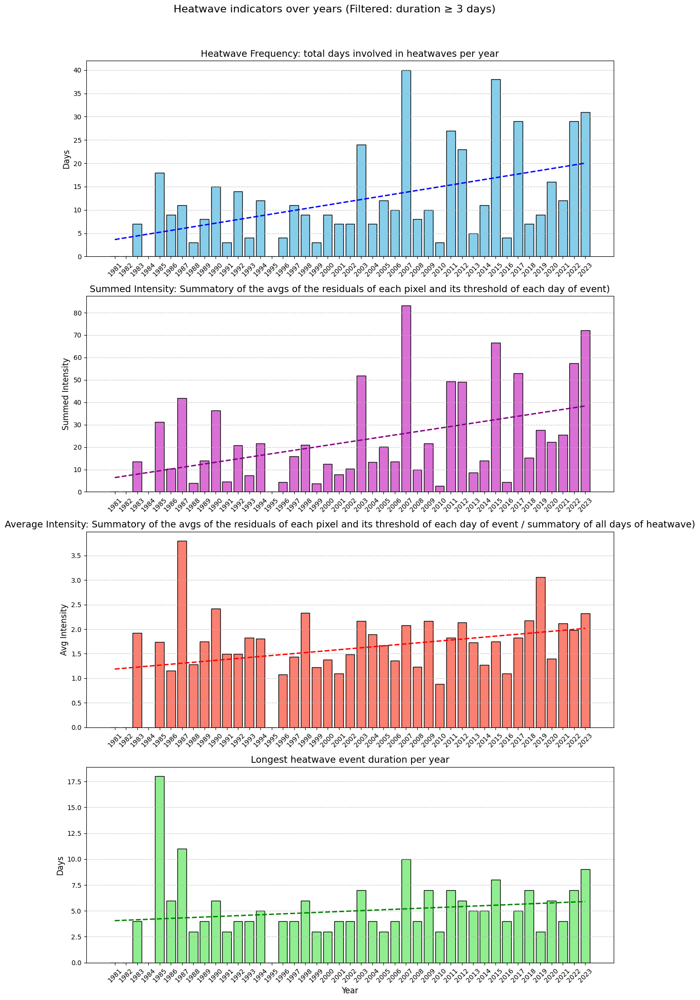

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ---------------------------
# PARAMETRI
# ---------------------------
CSV_EVENTS = "heat_waves_events_81_23.csv"
START_YEAR = 1981
END_YEAR = 2023

# ---------------------------
# CARICAMENTO E FILTRO DATI
# ---------------------------
df = pd.read_csv(CSV_EVENTS, parse_dates=["d_start", "d_end"])

# Filtro: solo eventi con durata ≥ 3 giorni
df = df[df["duration"] >= 3]

# ---------------------------
# RAGGRUPPAMENTO PER ANNO
# ---------------------------
grouped = df.groupby(df["d_start"].dt.year).agg(
    total_heatwave_days=("duration", "sum"),
    summed_intensity=("summed_avg_all_residuals", "sum"),
    max_duration=("duration", "max")
).reset_index().rename(columns={"d_start": "year"})

# Aggiungi anni mancanti (riempiti con 0)
all_years = pd.DataFrame({"year": np.arange(START_YEAR, END_YEAR + 1)})
grouped = pd.merge(all_years, grouped, on="year", how="left").fillna(0)

# Tipi coerenti
grouped["year"] = grouped["year"].astype(int)
grouped["total_heatwave_days"] = grouped["total_heatwave_days"].astype(int)
grouped["max_duration"] = grouped["max_duration"].astype(int)

# Calcola avg_intensity evitando divisioni per zero
grouped["avg_intensity"] = grouped["summed_intensity"] / grouped["total_heatwave_days"]
grouped["avg_intensity"] = grouped["avg_intensity"].replace([np.inf, -np.inf], 0).fillna(0)

# ---------------------------
# FUNZIONE TREND LINE
# ---------------------------
def plot_trend_line(ax, x, y, color='black'):
    coeffs = np.polyfit(x, y, 1)
    poly = np.poly1d(coeffs)
    x_line = np.linspace(x.min(), x.max(), 100)
    y_line = poly(x_line)
    ax.plot(x_line, y_line, color=color, linestyle="--", linewidth=2)

# ---------------------------
# PLOT
# ---------------------------
fig, axs = plt.subplots(4, 1, figsize=(12, 22), sharex=False)

# Etichette X comuni
xticks = grouped["year"]
xtick_labels = grouped["year"].astype(str)

# 1. Frequenza
axs[0].bar(grouped["year"], grouped["total_heatwave_days"], color="skyblue", edgecolor="black")
plot_trend_line(axs[0], grouped["year"], grouped["total_heatwave_days"], color="blue")
axs[0].set_title("Heatwave Frequency: total days involved in heatwaves per year", fontsize=14)
axs[0].set_ylabel("Days", fontsize=12)
axs[0].grid(axis="y", linestyle="--", alpha=0.7)
axs[0].set_xticks(xticks)
axs[0].set_xticklabels(xtick_labels, rotation=45)

# 2. Somma intensità (SUMMED)
axs[1].bar(grouped["year"], grouped["summed_intensity"], color="orchid", edgecolor="black")
plot_trend_line(axs[1], grouped["year"], grouped["summed_intensity"], color="purple")
axs[1].set_title("Summed Intensity: Summatory of the avgs of the residuals of each pixel and its threshold of each day of event)", fontsize=14)
axs[1].set_ylabel("Summed Intensity", fontsize=12)
axs[1].grid(axis="y", linestyle="--", alpha=0.7)
axs[1].set_xticks(xticks)
axs[1].set_xticklabels(xtick_labels, rotation=45)

# 3. Intensità media per giorno (AVERAGE)
axs[2].bar(grouped["year"], grouped["avg_intensity"], color="salmon", edgecolor="black")
plot_trend_line(axs[2], grouped["year"], grouped["avg_intensity"], color="orange")
axs[2].set_title("Average Intensity: Summatory of the avgs of the residuals of each pixel and its threshold of each day of event / summatory of all days of heatwave)", fontsize=14)
axs[2].set_ylabel("Avg Intensity", fontsize=12)
axs[2].grid(axis="y", linestyle="--", alpha=0.7)
axs[2].set_xticks(xticks)
axs[2].set_xticklabels(xtick_labels, rotation=45)

# 4. Durata massima
axs[3].bar(grouped["year"], grouped["max_duration"], color="lightgreen", edgecolor="black")
plot_trend_line(axs[3], grouped["year"], grouped["max_duration"], color="green")
axs[3].set_title("Longest heatwave event duration per year", fontsize=14)
axs[3].set_ylabel("Days", fontsize=12)
axs[3].set_xlabel("Year", fontsize=12)
axs[3].grid(axis="y", linestyle="--", alpha=0.7)
axs[3].set_xticks(xticks)
axs[3].set_xticklabels(xtick_labels, rotation=45)

plt.suptitle("Heatwave indicators over years (Filteorange: duration ≥ 3 days)", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.show()

#### 03.10 Matrix generation for heatwaves analysis
Matrix by duration

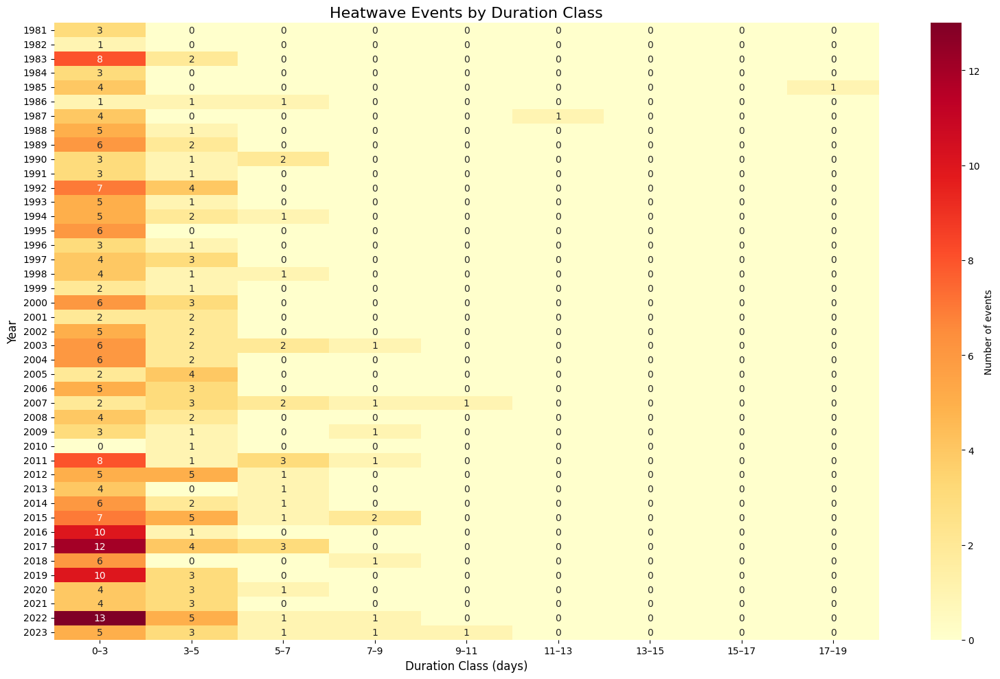

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# === CONFIG ===
csv_path = "heat_waves_events_81_23.csv"
colormap = "YlOrRd"
start_year = 1981
end_year = 2023

# === CARICAMENTO ===
df = pd.read_csv(csv_path, parse_dates=["d_start", "d_end"])
df["anno"] = df["d_start"].dt.year

# === FILTRO EVENTI CON DURATA ≥ 1 GIORNO ===
df = df[df["duration"] >= 1].copy()

# === CATEGORIZZAZIONE PER DURATA (12 classi) ===
bins = [0, 3, 5, 7, 9, 11, 13, 15, 17, 19]
labels = ["0–3", "3–5", "5–7", "7–9", "9–11", "11–13", "13–15", "15–17", "17–19"]
df["classe_durata"] = pd.cut(df["duration"], bins=bins, right=False, labels=labels)

# === MATRICE ANNO x CLASSE DURATA ===
pivot_durata = df.pivot_table(
    index="anno",
    columns="classe_durata",
    values="duration",
    aggfunc="count",
    fill_value=0
)

# === COMPLETA ANNI MANCANTI ===
anni_completi = pd.Index(np.arange(start_year, end_year + 1), name="anno")
pivot_durata = pivot_durata.reindex(anni_completi, fill_value=0)

# === PLOT ===
plt.figure(figsize=(16, 10))
sns.heatmap(
    pivot_durata,
    annot=True,
    fmt="d",
    cmap=colormap,
    linewidths=0,
    linecolor=None,
    cbar_kws={"label": "Number of events"}
)

plt.title("Heatwave Events by Duration Class", fontsize=16)
plt.xlabel("Duration Class (days)", fontsize=12)
plt.ylabel("Year", fontsize=12)
plt.tight_layout()

# === SALVATAGGIO PRIMA DELLA VISUALIZZAZIONE ===
plt.savefig(
    r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\Heatwave_events_by_dur_class.jpg",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

Matrix by average intensity

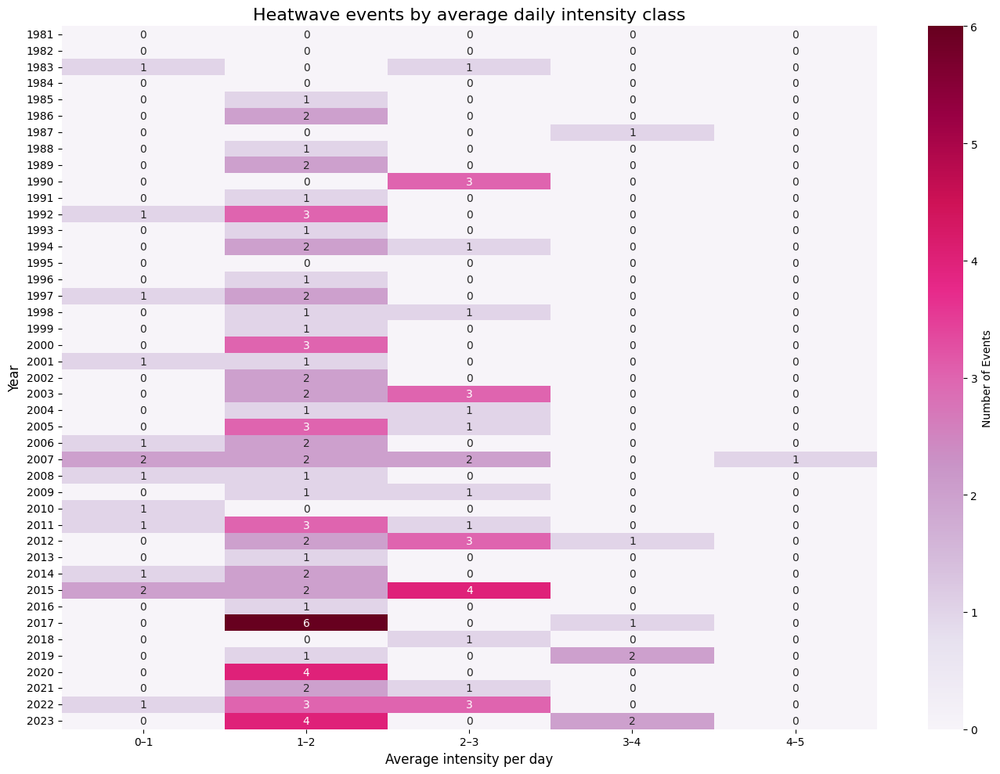

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# === CONFIG ===
csv_path = "heat_waves_events_81_23.csv"
start_year = 1981
end_year = 2023
STEP = 1                  # passo in gradi Celsius tra le classi
INTENSITY_MIN = 0
INTENSITY_MAX = 5
COLORMAP = "PuRd"        # _r = reversed

# === CARICAMENTO ===
df = pd.read_csv(csv_path, parse_dates=["d_start", "d_end"])
df["anno"] = df["d_start"].dt.year

# === FILTRO EVENTI CON DURATA ≥ 3 GIORNI ===
df = df[df["duration"] >= 3].copy()

# === CALCOLO INTENSITÀ MEDIA PER GIORNO ===
df["avg_intensity_per_day"] = df["summed_avg_all_residuals"] / df["duration"]
df["avg_intensity_per_day"] = df["avg_intensity_per_day"].replace([np.inf, -np.inf], np.nan).fillna(0)

# === CATEGORIZZAZIONE PER INTENSITÀ ===
bins = np.arange(INTENSITY_MIN, INTENSITY_MAX + STEP, STEP)
labels = [f"{round(b,1)}–{round(b+STEP,1)}" for b in bins[:-1]]
df["classe_intensita"] = pd.cut(df["avg_intensity_per_day"], bins=bins, right=False, labels=labels)

# === MATRICE: NUMERO DI EVENTI PER ANNO E CLASSE DI INTENSITÀ ===
pivot_count = df.pivot_table(
    index="anno",
    columns="classe_intensita",
    values="duration",  # qualunque colonna va bene per il count
    aggfunc="count",
    fill_value=0
)

# === COMPLETA ANNI MANCANTI ===
anni_completi = pd.Index(np.arange(start_year, end_year + 1), name="anno")
pivot_count = pivot_count.reindex(anni_completi, fill_value=0)

# === PLOT ===
plt.figure(figsize=(14, 10))
sns.heatmap(
    pivot_count,
    annot=True,
    fmt="d",
    cmap=COLORMAP,
    linewidths=0,
    linecolor=None,
    cbar_kws={"label": "Number of Events"}
)

plt.title("Heatwave events by average daily intensity class", fontsize=16)
plt.xlabel("Average intensity per day", fontsize=12)
plt.ylabel("Year", fontsize=12)
plt.tight_layout()

# === SALVATAGGIO PRIMA DELLA VISUALIZZAZIONE ===
plt.savefig(
    r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\Heatwave_events_by_avg_intensity.jpg",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

Adding a column to the heat waves database with the average intensity

In [3]:
import pandas as pd

# Carica il CSV
df = pd.read_csv("heat_waves_events_81_23.csv")

# Calcola la nuova colonna (es. rapporto tra colonne 'A' e 'B')
df["Avg_day_intensity"] = df["summed_avg_all_residuals"] / df["duration"].replace(0, pd.NA)

# Salva il nuovo CSV con la colonna aggiunta
df.to_csv("heat_waves_events_81_23.csv", index=False)

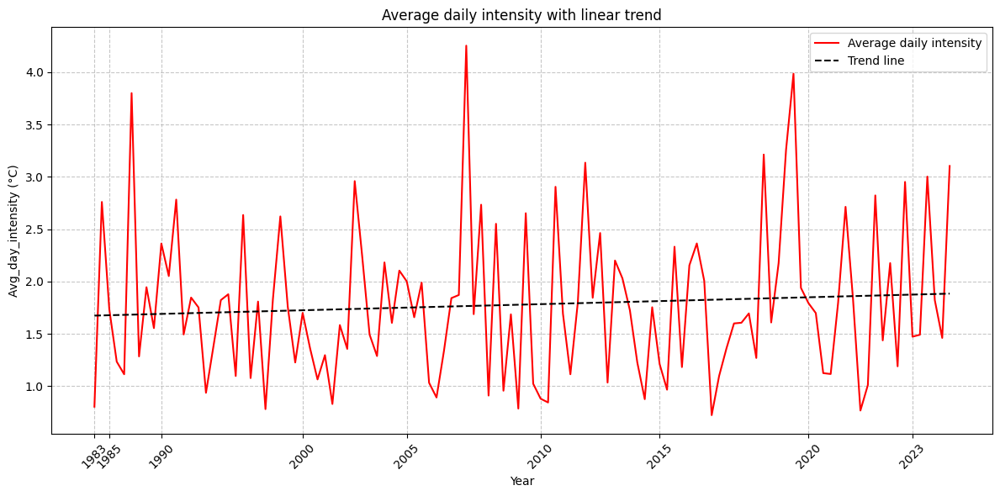

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Carica il CSV
df = pd.read_csv("heat_waves_events_81_23.csv")

# Filtro: escludi righe con durata <= 2
df = df[df["duration"] > 2].reset_index(drop=True)

# Asse X basato sull'indice filtrato
x = df.index
y = df["Avg_day_intensity"]

# Trend line
z = np.polyfit(x, y, 1)
p = np.poly1d(z)

# Crea il grafico
plt.figure(figsize=(12, 6))
plt.plot(x, y, linestyle='-', color='r', label="Average daily intensity")
plt.plot(x, p(x), linestyle='--', color='black', label="Trend line")

plt.xlabel("Year")
plt.ylabel("Avg_day_intensity (°C)")
plt.title("Average daily intensity with linear trend")

# Etichette asse X: anni multipli di 5 più primo e ultimo
unique_years = df["year"].unique()
years_to_show = sorted(set([unique_years[0], unique_years[-1]] + [y for y in unique_years if y % 5 == 0]))
ticks_to_show = [df[df["year"] == y].index[0] for y in years_to_show if y in df["year"].values]

plt.xticks(ticks_to_show, years_to_show, rotation=45)

plt.legend()
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.tight_layout()

# === SALVATAGGIO PRIMA DELLA VISUALIZZAZIONE ===
plt.savefig(
    r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\Heatwave_events_by_avg_intensity_line.jpg",
    dpi=300,
    bbox_inches="tight"
)

plt.show()


Matrix by sunned intensity

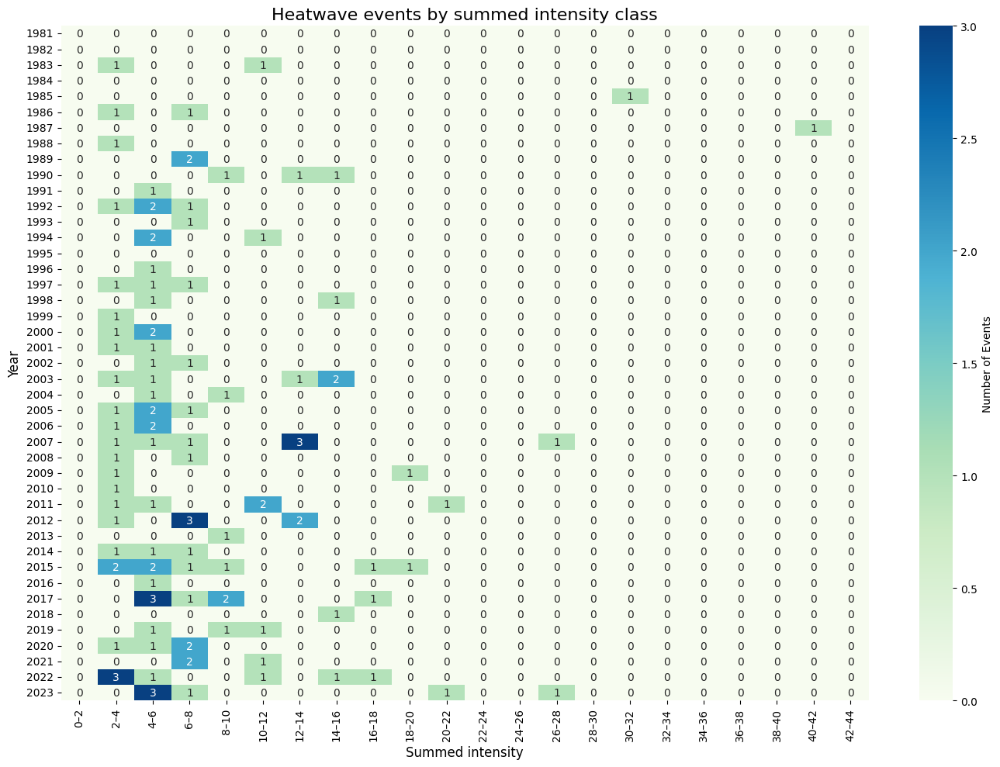

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# === CONFIG ===
csv_path = "heat_waves_events_81_23.csv"
start_year = 1981
end_year = 2023
STEP = 2                   # passo in gradi Celsius tra le classi (puoi modificarlo)
INTENSITY_MIN = 0
INTENSITY_MAX = 44
COLORMAP = "GnBu"            # puoi anche usare _r per invertire

# === CARICAMENTO ===
df = pd.read_csv(csv_path, parse_dates=["d_start", "d_end"])
df["anno"] = df["d_start"].dt.year

# === FILTRO EVENTI CON DURATA ≥ 3 GIORNI ===
df = df[df["duration"] >= 3].copy()

# === CATEGORIZZAZIONE PER INTENSITÀ CUMULATA ===
df["summed_intensity"] = df["summed_avg_all_residuals"]
bins = np.arange(INTENSITY_MIN, INTENSITY_MAX + STEP, STEP)
labels = [f"{round(b,1)}–{round(b+STEP,1)}" for b in bins[:-1]]
df["classe_intensita"] = pd.cut(df["summed_intensity"], bins=bins, right=False, labels=labels)

# === MATRICE: NUMERO DI EVENTI PER ANNO E CLASSE DI INTENSITÀ CUMULATA ===
pivot_count = df.pivot_table(
    index="anno",
    columns="classe_intensita",
    values="summed_intensity",
    aggfunc="count",
    fill_value=0
)

# === COMPLETA ANNI MANCANTI ===
anni_completi = pd.Index(np.arange(start_year, end_year + 1), name="anno")
pivot_count = pivot_count.reindex(anni_completi, fill_value=0)

# === PLOT ===
plt.figure(figsize=(14, 10))
sns.heatmap(
    pivot_count,
    annot=True,
    fmt="d",
    cmap=COLORMAP,
    linewidths=0,
    linecolor=None,
    cbar_kws={"label": "Number of Events"}
)

plt.title("Heatwave events by summed intensity class", fontsize=16)
plt.xlabel("Summed intensity", fontsize=12)
plt.ylabel("Year", fontsize=12)
plt.tight_layout()
plt.show()

#### 03.11 - Short event analysis

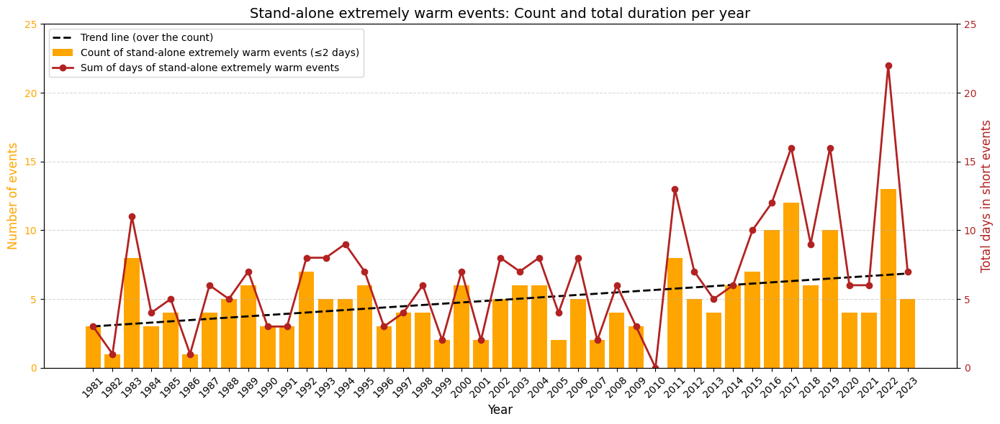

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# === CONFIG ===
csv_path = "heat_waves_events_81_23.csv"
durata_massima = 2
start_year = 1981
end_year = 2023

# === CARICAMENTO ===
df = pd.read_csv(csv_path, parse_dates=["d_start", "d_end"])
df["anno"] = df["d_start"].dt.year

# === FILTRO EVENTI BREVI (≤2 GIORNI) ===
df_short = df[df["duration"] <= durata_massima].copy()

# === CONTEGGIO EVENTI & GIORNI PER ANNO ===
all_years = np.arange(start_year, end_year + 1)
event_count = df_short["anno"].value_counts().reindex(all_years, fill_value=0).sort_index()
total_days = df_short.groupby("anno")["duration"].sum().reindex(all_years, fill_value=0)

# === CALCOLO RANGE COMUNE PER ALLINEARE GLI ASSI ===
max_y = max(event_count.max(), total_days.max())
y_max = int(np.ceil(max_y / 5)) * 5  # arrotonda al multiplo di 5 superiore

# === PLOT ===
fig, ax1 = plt.subplots(figsize=(14, 6))

# Barre = numero di eventi
ax1.bar(event_count.index, event_count.values, color="orange", label="Count of stand-alone extremely warm events (≤2 days)")
ax1.set_ylabel("Number of events", fontsize=12, color="orange")
ax1.tick_params(axis='y', labelcolor="orange")
ax1.set_xlabel("Year", fontsize=12)
ax1.set_xticks(all_years)
ax1.set_xticklabels(all_years, rotation=45)
ax1.set_ylim(0, y_max)

# Trendline (event count)
x_vals = event_count.index.values
y_vals = event_count.values
coeffs = np.polyfit(x_vals, y_vals, 1)
trendline = np.poly1d(coeffs)
ax1.plot(x_vals, trendline(x_vals), color="black", linestyle="--", linewidth=2, label="Trend line (over the count)")

# Linea secondaria = somma dei giorni
ax2 = ax1.twinx()
ax2.plot(total_days.index, total_days.values, color="firebrick", marker="o", linewidth=2, label="Sum of days of stand-alone extremely warm events")
ax2.set_ylabel("Total days in short events", fontsize=12, color="firebrick")
ax2.tick_params(axis='y', labelcolor="firebrick")
ax2.set_ylim(0, y_max)  # stesso range dell'altro asse

# Titolo e griglia
plt.title("Stand-alone extremely warm events: Count and total duration per year", fontsize=14)
ax1.grid(axis="y", linestyle="--", alpha=0.5)

# Legenda combinata
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc="upper left")

plt.tight_layout()

# === SALVATAGGIO PRIMA DELLA VISUALIZZAZIONE ===
plt.savefig(
    r"C:\Users\andre\OneDrive - Politecnico di Milano\Tesi_di_laurea\elab\04_Outputs\Short_events_analysis.jpg",
    dpi=300,
    bbox_inches="tight"
)

plt.show()